# IMAGE EXPLORATION
Anaële BAUDANT-COJAN, Pety Ialimita RAKOTONIAINA, Yuchen XIA <br>
Palaiseau, June 2024, Telecom Paris MS IA
______________________________________________________
**SUMMARY**<br>


**0. Image statistics (size, color or graeyscale)**<br>
**1. Source (db1, db2, db3), color ratio and gender<br>**
     1.1. Image distribution between source (db1, db2 & db3), color ratio and gender<br>
     1.2. Level of Face occlusion by gender<br>
**2. Pixel distribution for color images vs grayscale images**<br>
**3. Pixel distribution by gender & occlusion level**<br>
**4. Gender classification model (for test dataset)**<br>
**5. Image visualisation**

In [1]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cv2
import os
import pickle

In [7]:
from functions import show_images, get_device, preprocess_df

# Load Data

In [8]:
df_train = pd.read_csv("Data/listes_training/data_100K/train_100K.csv", delimiter=' ')
df_test = pd.read_csv("Data/listes_training/data_100K/test_students.csv", delimiter=' ')

image_dir = "Data/crops_100K"
device = get_device()

In [9]:
print(df_train.shape)
print(df_test.shape)

(101345, 3)
(30507, 1)


In [10]:
print(df_train.head(-10))
print(type(df_train))

                                                 filename  FaceOcclusion  \
0                               database1/img00011271.jpg          0.019   
1                               database1/img00012471.jpg          0.035   
2                               database1/img00008127.jpg          0.127   
3                               database1/img00008972.jpg          0.014   
4                               database1/img00028187.jpg          0.346   
...                                                   ...            ...   
101330  database3/database3/m.01drbr/59-FaceId-0_align...          0.000   
101331  database3/database3/m.01drbr/69-FaceId-0_align...          0.021   
101332  database3/database3/m.01drbr/7-FaceId-0_align.jpg          0.008   
101333  database3/database3/m.01drbr/71-FaceId-0_align...          0.005   
101334  database3/database3/m.01drbr/72-FaceId-0_align...          0.009   

        gender  
0        0.999  
1        1.000  
2        0.001  
3        0.999  
4 

# Comments : 
Clearly, we will be dealing with images here. For each image, we have the following information:
- FaceOcclusion, expressed as a percentage ; 
- Gender, which ranges from 0 to 1.

The FaceOcclusion variable is quite straightforward to interpret. For example, 1.9% of the first image is occluded. However, the gender variable is less intuitive. Let's describe it a bit more to better understand what it represents.

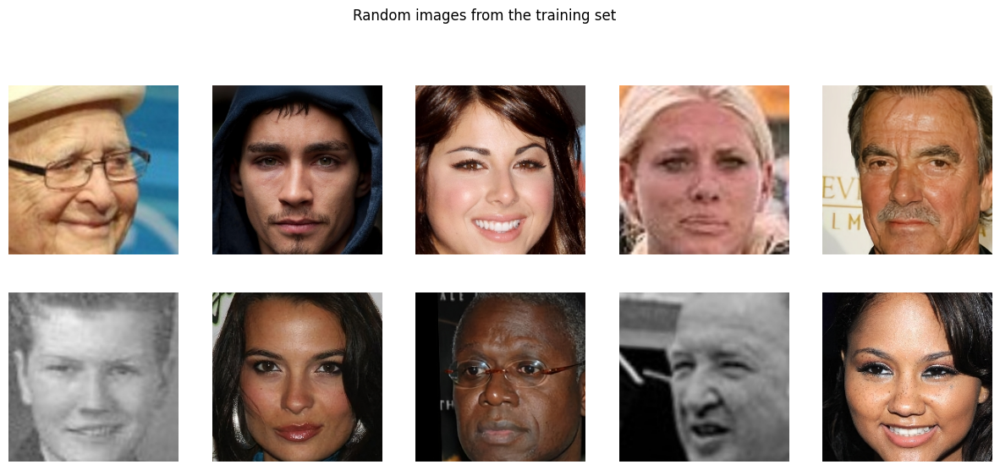

In [14]:
show_images(df_train.sample(10), image_dir, title='Random images from the training set')

As we can see, there are Men and Women in our data. But what can be the Gender frontier when we use the gender variable? 

In [16]:
df_train["gender"].describe()

count    101345.000000
mean          0.599754
std           0.486106
min           0.000000
25%           0.001000
50%           0.996000
75%           0.999000
max           1.000000
Name: gender, dtype: float64

Since the gender value ranges from "0" to "1", it can be interpreted as a probability of being female or male. Can we precise then? 

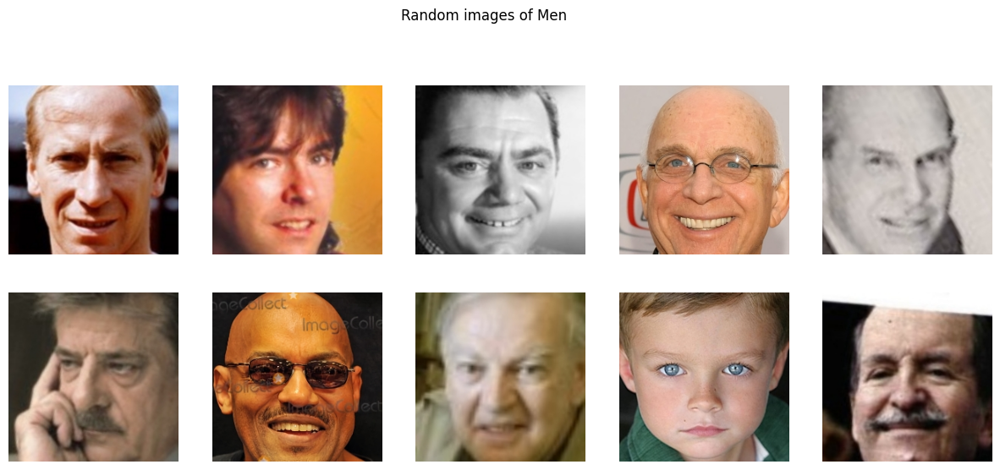

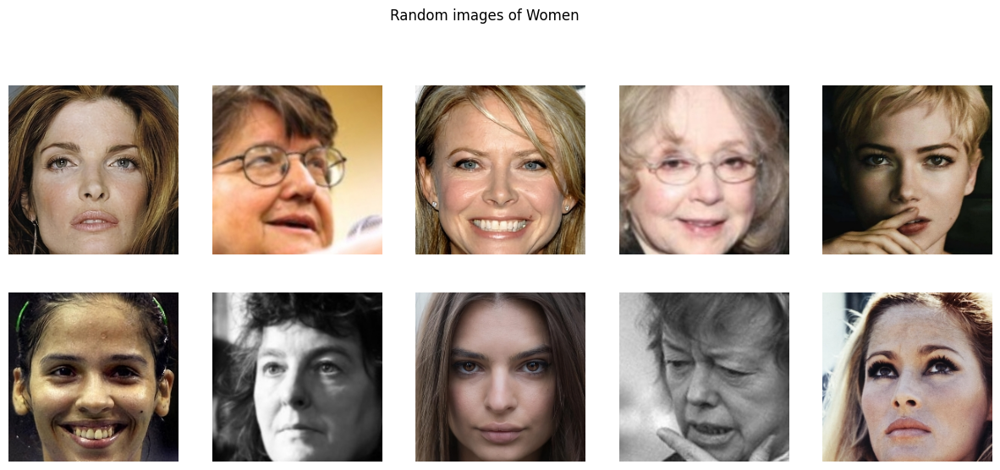

In [25]:
# Let's try 
men = df_train[df_train['gender']>0.5]
women = df_train[df_train['gender']<0.5]

show_images(men.sample(10), image_dir, title='Random images of Men')
show_images(women.sample(10), image_dir, title='Random images of Women')

"0" represents being male and "1" represents being female.  The closer the value is to 0, the more likely the person is male, and vice versa.
50% of the values are below 0.99. It suggests that there might be significantly more females than males in the dataset.

As we can see, some images are in color while others are in black and white. Therefore, we need to create a variable to label each image accordingly. Additionally, we prefer to process images using the RGB (Red, Green, Blue) color model and extract relevant pixel-based variables.

# 0. Processing

In [32]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101345 entries, 0 to 101344
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   filename       101345 non-null  object 
 1   FaceOcclusion  101341 non-null  float64
 2   gender         101345 non-null  float64
dtypes: float64(2), object(1)
memory usage: 2.3+ MB


In [33]:
os.getcwd()

'D:\\Télécom_Paris\\Data challenge 2.0'

In [34]:
# Chemin relatif depuis ton dossier de travail actuel
path = os.path.join(os.getcwd(), "pickle")

if os.path.exists(path):
    print("Le dossier 'pickle' existe.")
    print("Contenu :", os.listdir(path))
else:
    print("Le dossier 'pickle' n'existe pas.")

Le dossier 'pickle' existe.
Contenu : ['.ipynb_checkpoints', 'df_test.pkl', 'df_test_with_gender.pkl', 'df_train.pkl', 'model_color.pt', 'pixel_distribution_train_color_m_occ_level.pkl', 'pixel_distribution_train_color_w_occ_level.pkl', 'pixel_distribution_train_gray_m_occ_level.pkl', 'pixel_distribution_train_gray_w_occ_level.pkl', 'train.pkl', 'val.pkl', 'val_with_gender.pkl']


In [35]:
# Preprocessing (circa 10 minutes with GPU)
preprocess = True # False

if preprocess== True:

    # Preprocess the train data
    print('Preprocessing train dataset')
    df_train = preprocess_df(df_train, image_dir, process_mediapipe=False)

    # Preprocess the test data
    print('\nPreprocessing test dataset')
    df_test = preprocess_df(df_test, image_dir, process_mediapipe=False)

    # Save the preprocessed data to pickle file
    with open('pickle/df_train.pkl', 'wb') as file: pickle.dump(df_train, file)
    with open('pickle/df_test.pkl', 'wb') as file:  pickle.dump(df_test, file)

else:
    # opened already preprocessed files
    with open('pickle/df_train.pkl', 'rb') as file:
        df_train = pickle.load(file)
    with open('pickle/df_test.pkl', 'rb') as file:
        df_test = pickle.load(file)

Preprocessing train dataset
0


D:\Télécom_Paris\Data challenge 2.0\functions.py:113: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '107.7478409332483' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean'] = np.mean(image)
D:\Télécom_Paris\Data challenge 2.0\functions.py:114: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '132.7415098852041' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean_R'] = np.mean(image[:, :, 0])
D:\Télécom_Paris\Data challenge 2.0\functions.py:115: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100.51054288903062' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean_G'] = np

5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000
65000
70000
75000
80000
85000
90000
95000
100000

Preprocessing test dataset
0


D:\Télécom_Paris\Data challenge 2.0\functions.py:113: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '117.48270753613946' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean'] = np.mean(image)
D:\Télécom_Paris\Data challenge 2.0\functions.py:114: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '137.7704081632653' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean_R'] = np.mean(image[:, :, 0])
D:\Télécom_Paris\Data challenge 2.0\functions.py:115: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '104.31028778698979' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[i, 'pixels_mean_G'] = n

5000
10000
15000
20000
25000
30000


In [37]:
## Exporter les données après processing
df_train.to_csv("df_train.csv", index_label = False)
df_test.to_csv("df_test.csv", index_label = False)

## Columns Added After Preprocessing (`preprocess_df`)

The table below describes the new columns automatically generated when image preprocessing is applied to the DataFrame.

| **Column**             | **Description**                                                                 |
|------------------------|----------------------------------------------------------------------------------|
| `initial_index`        | Original row index before preprocessing (helps trace back original rows)         |
| `db_number`            | Database number extracted from `filename` (e.g., `database1/` → `1`)     
We have three Database.       |
| `count`                | Always equal to `1`, useful for aggregation operations (`groupby`)              |
| `color`, `no_color`    | Indicates if the image is in color (`1`) or grayscale (`0`)                     |
| `image_width`          | Width of the image in pixels                                                    |
| `image_height`         | Height of the image in pixels                                                   |
| `pixels`               | Total number of pixels (`width × height`)                                       |
| `pixels_mean`          | Mean of all pixel values (across all channels)                                  |
| `pixels_mean_R/G/B`    | Mean pixel intensity per channel: Red (`R`), Green (`G`), Blue (`B
Why only Red, Green, and Blue (RGB)? Most images are stored in RGB format, where each pixel has 3 color values: R (Red), G (Green), B (Blue). Standard for JPEG, PNG, etc.`)            |
| `pixels_std`           | Standard deviation of all pixel values (overall intensity variation)            |
| `pixels_std_R/G/B`     | Standard deviation per channel (`R`, `G`, `B`)l (`R`, `G`, `B`)

# 4. Pixel distribution by gender & occlusion level

In [ ]:
# loss function
class WeightedMSELoss(nn.Module):
    """
    Weighted Mean Squared Error Loss:
    Applies a custom weight to each element of the squared error
    before computing the mean. This allows certain samples to 
    have more or less influence on the total loss.
    """
    def __init__(self, weights):
        super(WeightedMSELoss, self,).__init__()
        self.weights = weights
        self.mse = nn.MSELoss(reduction='none')

    def forward(self, input, target, weights):
        # Compute the element-wise squared error
        squared_error = (input - target) ** 2
        # Apply weights to the squared errors
        weighted_squared_error = weights * squared_error
        # Compute the mean of the weighted squared errors
        loss = torch.mean(weighted_squared_error)
        return loss

class WeightedMSELoss2(nn.Module):
    """
    Context-Aware Weighted MSE Loss:
    Computes MSE and applies dynamic weights based on two factors:
    - 'ranges' (e.g., age groups or categories)
    - 'genders' (e.g., male or female)
    
    The weights are retrieved from user-provided dictionaries and 
    combined multiplicatively to emphasize/de-emphasize specific groups.
    """
    def __init__(self, range_weights, gender_weights):
        super(WeightedMSELoss2, self).__init__()
        self.range_weights = range_weights
        self.gender_weights = gender_weights
        self.mse = nn.MSELoss(reduction='none')

    def forward(self, inputs, targets, ranges, genders):
        loss = self.mse(inputs, targets)
        range_weights = torch.tensor([self.range_weights[str(label)] for label in ranges], device=inputs.device)
        gender_weights = torch.tensor([self.gender_weights['male'] if gender > 0.5 else self.gender_weights['female'] for gender in genders], device=inputs.device)
        total_weights = range_weights * gender_weights
        weighted_loss = loss * total_weights
        return weighted_loss.mean()

# 4. Gender classification model (for test dataset)

## Introduction to the model that we use

We trained two deep learning models to predict gender from face images using the ResNet-18 architecture with transfer learning. 

To make training more balanced and fair, we applied a custom weighted loss that gives more importance to less-represented age groups and genders.

The two models are:
- model_color.pt – Trained on color images
- model_gray.pt – Trained on grayscale images

Both models have the same structure and goal. The main difference is the type of image input, allowing us to compare how color affects gender prediction performance.

## COLOR IMAGES GENDER CLASSIFICATION MODEL

In [ ]:
df = df_train[df_train['color']==1].reset_index(drop=True) # COLOR = 1"
range_counts = df['range'].value_counts().sort_index()
range_means = df.groupby('range')['FaceOcclusion'].mean()
stats_ = pd.concat([range_counts, range_means], axis=1)
print(stats_)

# compute the weights for the loss function
total_samples = len(df)
weights = {label: total_samples / count for label, count in range_counts.items()}
print(weights)

# split the train dataset into train and validation datasets
train, val = train_test_split(df, test_size=0.2, stratify=df['stratification'], random_state=42)
train = train.reset_index(drop=True)
val = val.reset_index(drop=True)
print('train:', len(train), 'validation:', len(val))
train_set = Dataset(train, image_dir)
val_set = Dataset(val, image_dir)

# create DataLoaders
batch_size = 128
training_generator = torch.utils.data.DataLoader(train_set, batch_size=512, shuffle=True, num_workers=0)
validation_generator = torch.utils.data.DataLoader(val_set, batch_size=512, shuffle=True, num_workers=0)

# COLOR - TRAIN GENDER CLASSIFICATION MODEL

# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)
model = model.to(device)

# Parameters
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = WeightedMSELoss(weights) # stratification by range and gender

num_epochs = 10
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()
    running_loss = 0.0
    for batch_idx, (X, y, gender, filename) in tqdm(enumerate(training_generator), total=len(training_generator)):
        X, gender = X.to(device), gender.to(device).view(-1, 1)
        
        # FaceOcclusion range
        batch_ranges = pd.cut(y.cpu().numpy().flatten(), bins=bins, labels=labels, include_lowest=True)
        batch_ranges_id = [labels.index(label) for label in batch_ranges]
        batch_weights = gender*10 + torch.tensor(batch_ranges_id, device=device).float()
        optimizer.zero_grad()
        gender_pred = model(X)
        loss = criterion(gender_pred, gender, batch_weights)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        if batch_idx % 5 == 0:
            print(f"Batch {batch_idx}, Loss: {loss.item()}")

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(training_generator)}")

print('Training complete')

# save gender models
model_color = model
torch.save(model_color.state_dict(), 'model_color.pt')

C:\Users\anaele.baudant\AppData\Local\Temp\ipykernel_12516\1169181967.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  range_means = df.groupby('range')['FaceOcclusion'].mean()
C:\Users\anaele.baudant\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\anaele.baudant\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` 

          count  FaceOcclusion
range                         
0-0.05    40949       0.020032
0.05-0.1  16116       0.073567
0.1-0.15  11102       0.123937
0.15-0.2   7287       0.173578
0.2-0.25   4815       0.223811
0.25-0.3   3466       0.274017
0.3-0.35   2218       0.322967
0.35-0.4    932       0.370947
0.4-1.0     381       0.458913
{'0-0.05': 2.1310898923050625, '0.05-0.1': 5.414867212707868, '0.1-0.15': 7.8603855161232214, '0.15-0.2': 11.97557293810896, '0.2-0.25': 18.123779854620977, '0.25-0.3': 25.177726485862667, '0.3-0.35': 39.344454463480616, '0.35-0.4': 93.63304721030043, '0.4-1.0': 229.04461942257217}
train: 69812 validation: 17454
Epoch 1/10


  1%|          | 1/137 [00:26<1:00:18, 26.61s/it]

Batch 0, Loss: 3.2972347736358643


  4%|▍         | 6/137 [02:41<58:53, 26.97s/it]  

Batch 5, Loss: 0.6826254725456238


  8%|▊         | 11/137 [04:55<56:12, 26.77s/it]

Batch 10, Loss: 0.5031489133834839


 12%|█▏        | 16/137 [07:09<53:57, 26.75s/it]

Batch 15, Loss: 0.3909580409526825


 15%|█▌        | 21/137 [09:21<51:01, 26.39s/it]

Batch 20, Loss: 0.3487139046192169


 19%|█▉        | 26/137 [11:31<48:22, 26.15s/it]

Batch 25, Loss: 0.3281237781047821


 23%|██▎       | 31/137 [13:43<46:25, 26.28s/it]

Batch 30, Loss: 0.26927241683006287


 26%|██▋       | 36/137 [15:57<45:18, 26.91s/it]

Batch 35, Loss: 0.2697781026363373


 30%|██▉       | 41/137 [18:10<42:51, 26.79s/it]

Batch 40, Loss: 0.22985751926898956


 34%|███▎      | 46/137 [20:25<40:49, 26.92s/it]

Batch 45, Loss: 0.22819074988365173


 37%|███▋      | 51/137 [22:39<38:07, 26.60s/it]

Batch 50, Loss: 0.28044578433036804


 41%|████      | 56/137 [24:53<36:03, 26.71s/it]

Batch 55, Loss: 0.18694323301315308


 45%|████▍     | 61/137 [27:07<33:51, 26.73s/it]

Batch 60, Loss: 0.21269942820072174


 48%|████▊     | 66/137 [29:19<31:25, 26.56s/it]

Batch 65, Loss: 0.1996779590845108


 52%|█████▏    | 71/137 [31:30<28:48, 26.18s/it]

Batch 70, Loss: 0.15918435156345367


 55%|█████▌    | 76/137 [33:39<26:23, 25.95s/it]

Batch 75, Loss: 0.18957459926605225


 59%|█████▉    | 81/137 [35:49<24:15, 26.00s/it]

Batch 80, Loss: 0.1704624891281128


 63%|██████▎   | 86/137 [37:59<22:01, 25.91s/it]

Batch 85, Loss: 0.18196792900562286


 64%|██████▍   | 88/137 [39:21<21:54, 26.84s/it]


KeyboardInterrupt: 

## BLACK AND WHITE GENDER CLASSIFIER MODEL

In [ ]:
df = df_train[df_train['color']==0].reset_index(drop=True) # COLOR = 1 GRAY SCALE=0"
range_counts = df['range'].value_counts().sort_index()
range_means = df.groupby('range')['FaceOcclusion'].mean()
stats_ = pd.concat([range_counts, range_means], axis=1)
print(stats_)

# compute the weights for the loss function
total_samples = len(df)
weights = {label: total_samples / count for label, count in range_counts.items()}
print(weights)

# split the train dataset into train and validation datasets
train, val = train_test_split(df, test_size=0.2, stratify=df['stratification'], random_state=42)
train = train.reset_index(drop=True)
val = val.reset_index(drop=True)
print('train:', len(train), 'validation:', len(val))
train_set = Dataset(train, image_dir)
val_set = Dataset(val, image_dir)

# create DataLoaders
batch_size = 128
training_generator = torch.utils.data.DataLoader(train_set, batch_size=512, shuffle=True, num_workers=0)
validation_generator = torch.utils.data.DataLoader(val_set, batch_size=512, shuffle=True, num_workers=0)

# COLOR - TRAIN GENDER CLASSIFICATION MODEL

# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)
model = model.to(device)

# Parameters
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = WeightedMSELoss(weights) # stratification by range and gender

num_epochs = 10
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()
    running_loss = 0.0
    for batch_idx, (X, y, gender, filename) in tqdm(enumerate(training_generator), total=len(training_generator)):
        X, gender = X.to(device), gender.to(device).view(-1, 1)
        
        # FaceOcclusion range
        batch_ranges = pd.cut(y.cpu().numpy().flatten(), bins=bins, labels=labels, include_lowest=True)
        batch_ranges_id = [labels.index(label) for label in batch_ranges]
        batch_weights = gender*10 + torch.tensor(batch_ranges_id, device=device).float()
        optimizer.zero_grad()
        gender_pred = model(X)
        loss = criterion(gender_pred, gender, batch_weights)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        if batch_idx % 5 == 0:
            print(f"Batch {batch_idx}, Loss: {loss.item()}")

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(training_generator)}")

print('Training complete')

# save gender models
model_gray = model
torch.save(model_gray.state_dict(), 'model_gray.pt')

/home/anaele/myenv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/anaele/myenv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


          range  FaceOcclusion
0-0.05     8071       0.019054
0.05-0.1   2498       0.072791
0.1-0.15   1416       0.122588
0.15-0.2    868       0.173618
0.2-0.25    571       0.223939
0.25-0.3    390       0.273274
0.3-0.35    179       0.320732
0.35-0.4     68       0.373324
0.4-1.0      14       0.457429
{'0-0.05': 1.743897906083509, '0.05-0.1': 5.634507606084868, '0.1-0.15': 9.939971751412429, '0.15-0.2': 16.215437788018434, '0.2-0.25': 24.649737302977233, '0.25-0.3': 36.08974358974359, '0.3-0.35': 78.63128491620111, '0.35-0.4': 206.98529411764707, '0.4-1.0': 1005.3571428571429}
train: 11260 validation: 2815
Epoch 1/3


  5%|████▋                                                                                                  | 1/22 [01:08<24:01, 68.65s/it]

Batch 0, Loss: 6.376005172729492


 27%|████████████████████████████                                                                           | 6/22 [06:40<17:46, 66.65s/it]

Batch 5, Loss: 2.0147900581359863


 36%|█████████████████████████████████████▍                                                                 | 8/22 [10:00<17:31, 75.07s/it]


KeyboardInterrupt: 

## save gender models

In [ ]:
torch.save(model_color.state_dict(), 'model_color.pt')
torch.save(model_gray.state_dict(), 'model_gray.pt')

# 5. Image visualisation

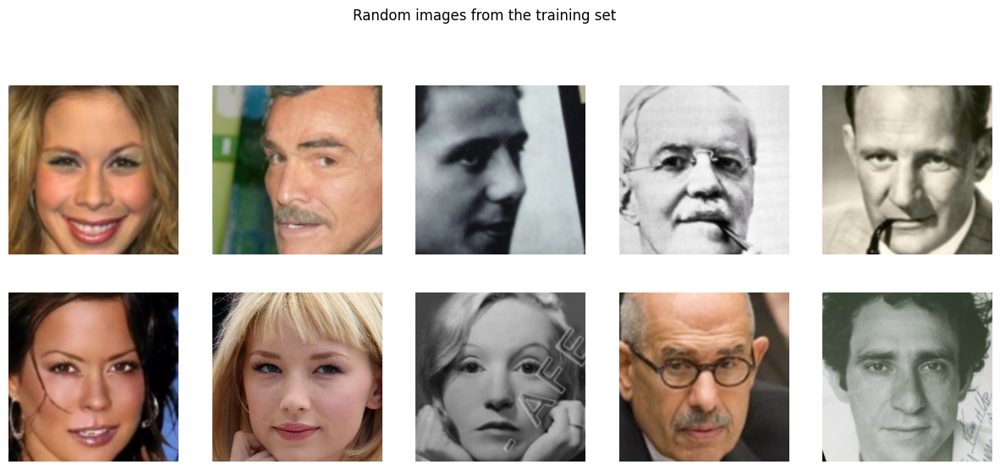

In [ ]:
show_images(df_train.sample(10), image_dir, title='Random images from the training set')

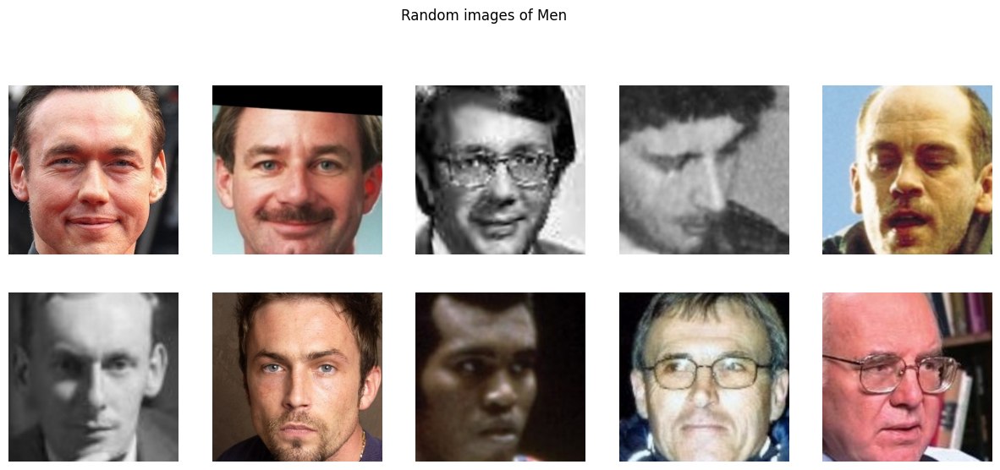

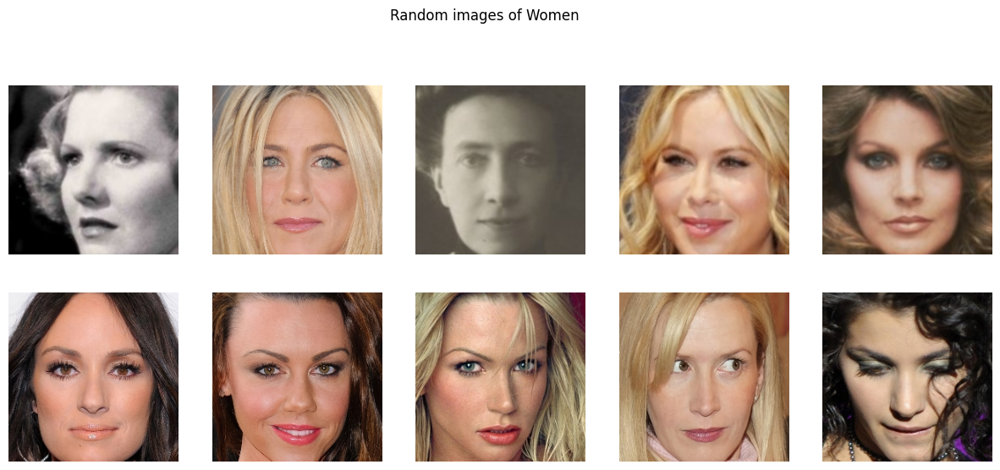

In [ ]:
men = df_train[df_train['gender']>0.5]
women = df_train[df_train['gender']<0.5]

show_images(men.sample(10), image_dir, title='Random images of Men')
show_images(women.sample(10), image_dir, title='Random images of Women')

# Gender distribution

## 1.1. Face occlusion Distribution analysis

# IMAGES BY DESCENDING OCCLUSION

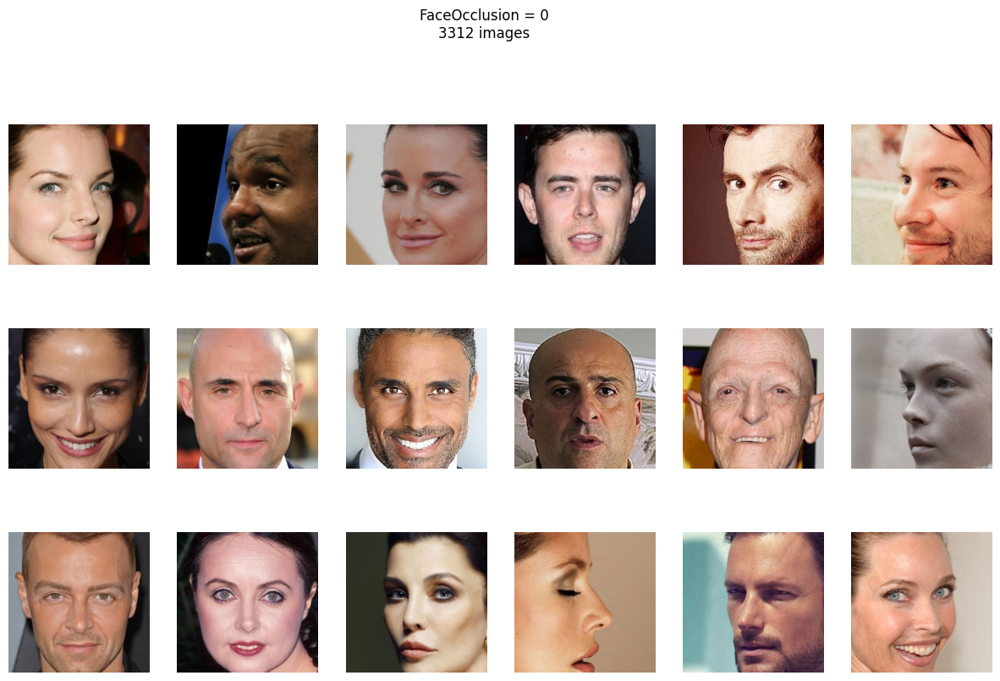

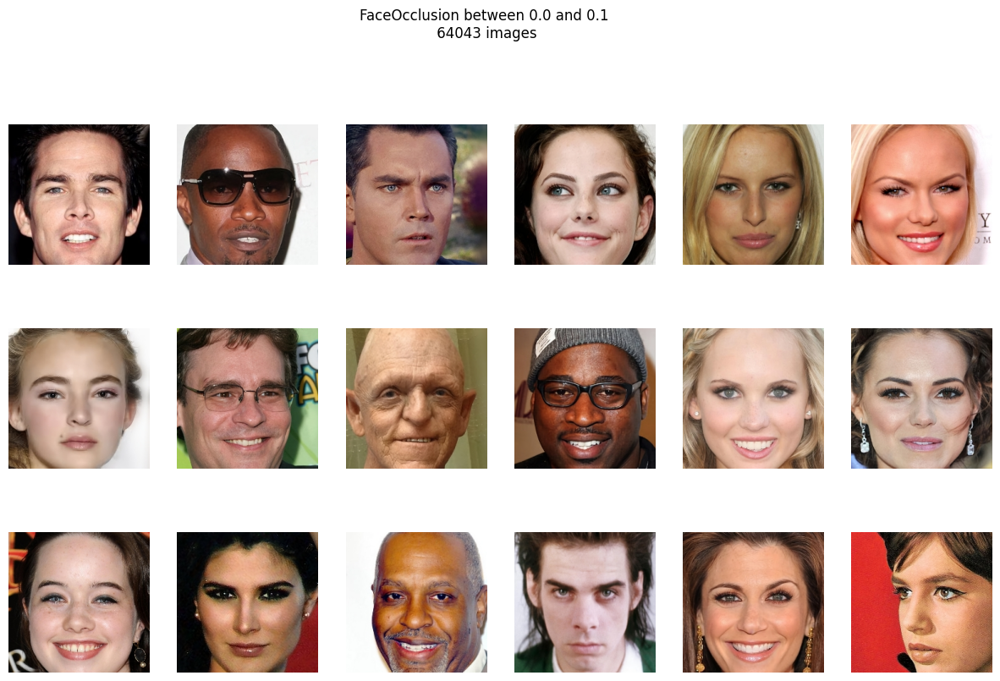

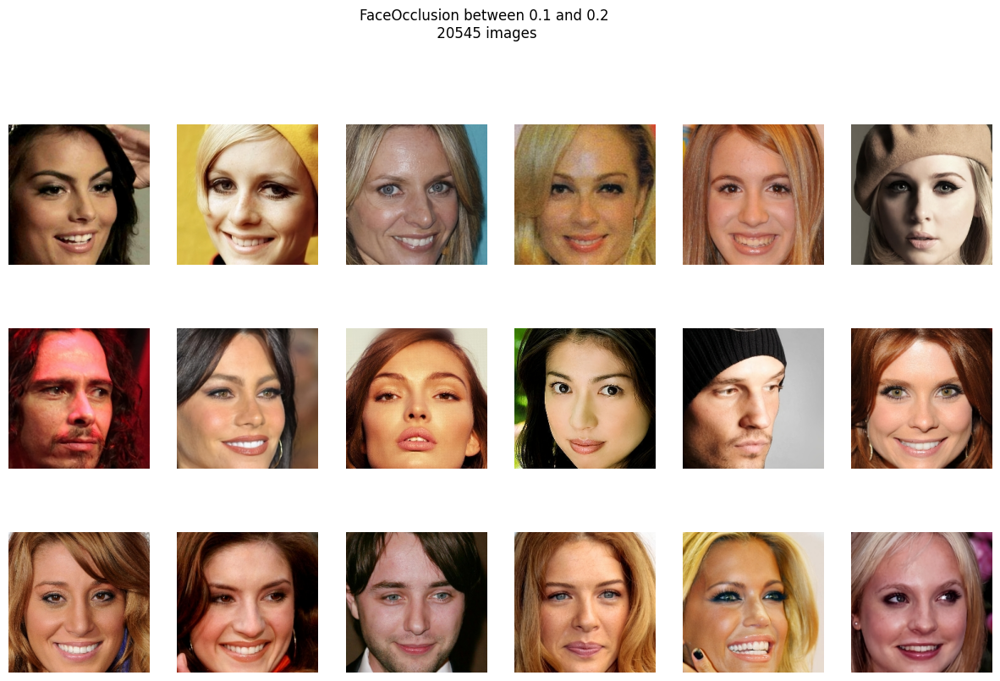

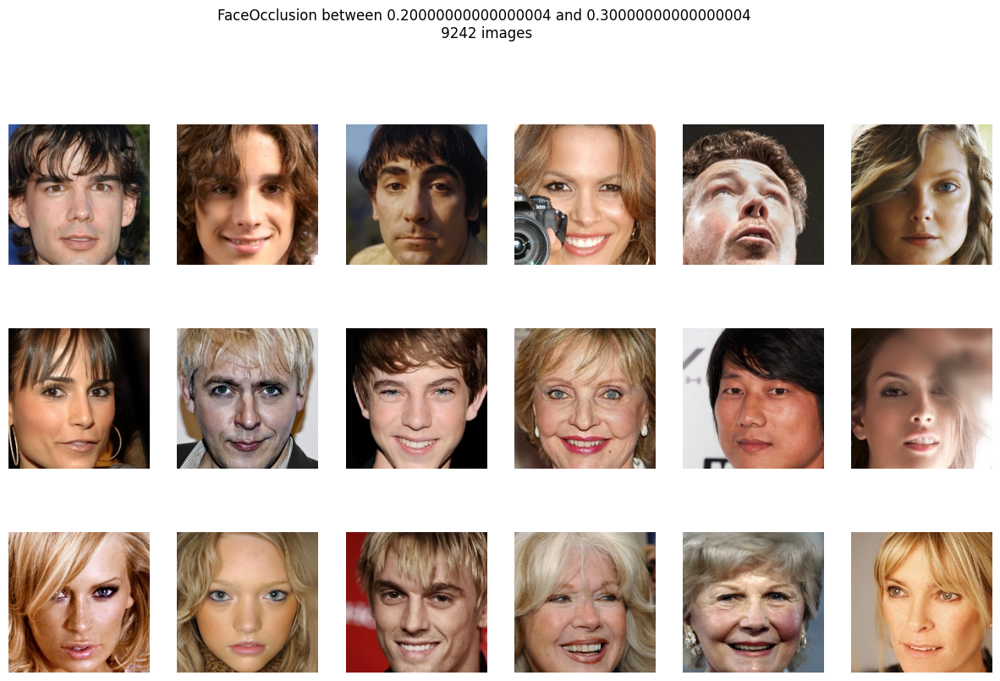

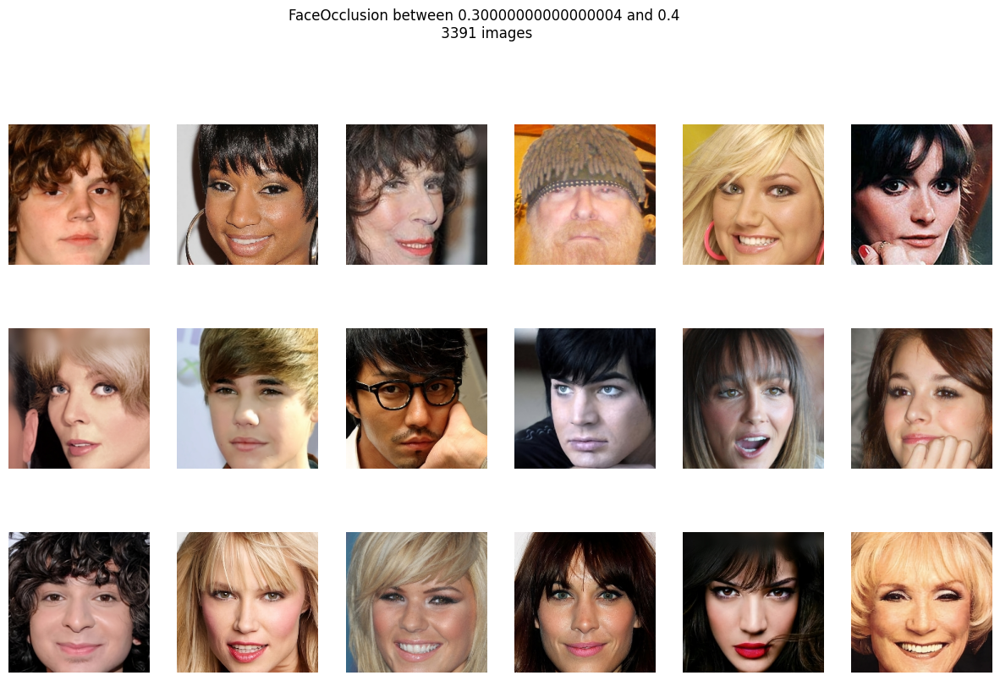

...

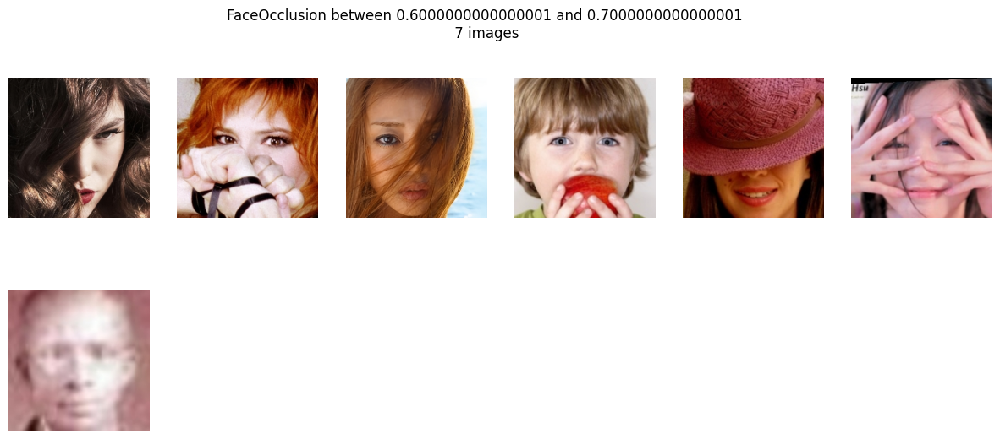

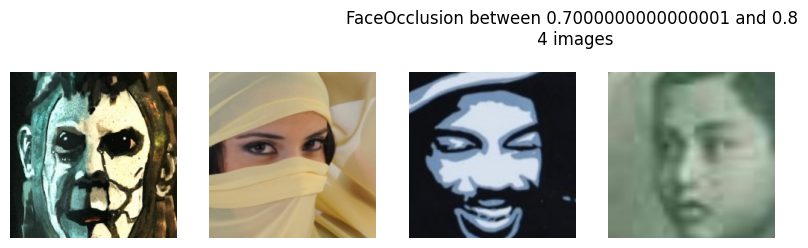

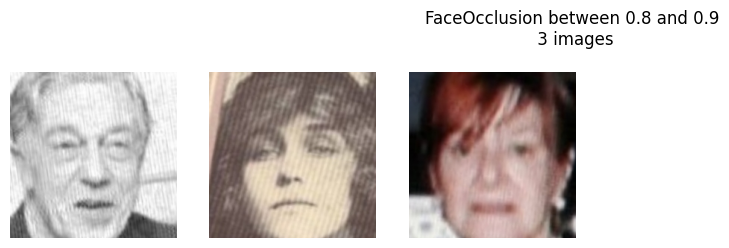

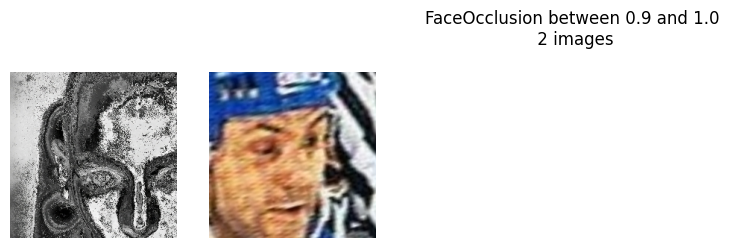

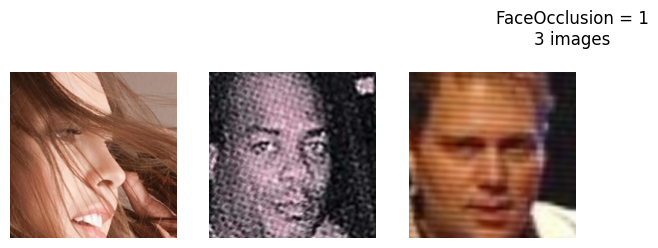

# 1.3 Explore by data set and black and white images

In [ ]:
# Create a column with the database number

df_train['db_number'] = df_train['filename'].apply(lambda x: x[8:9])

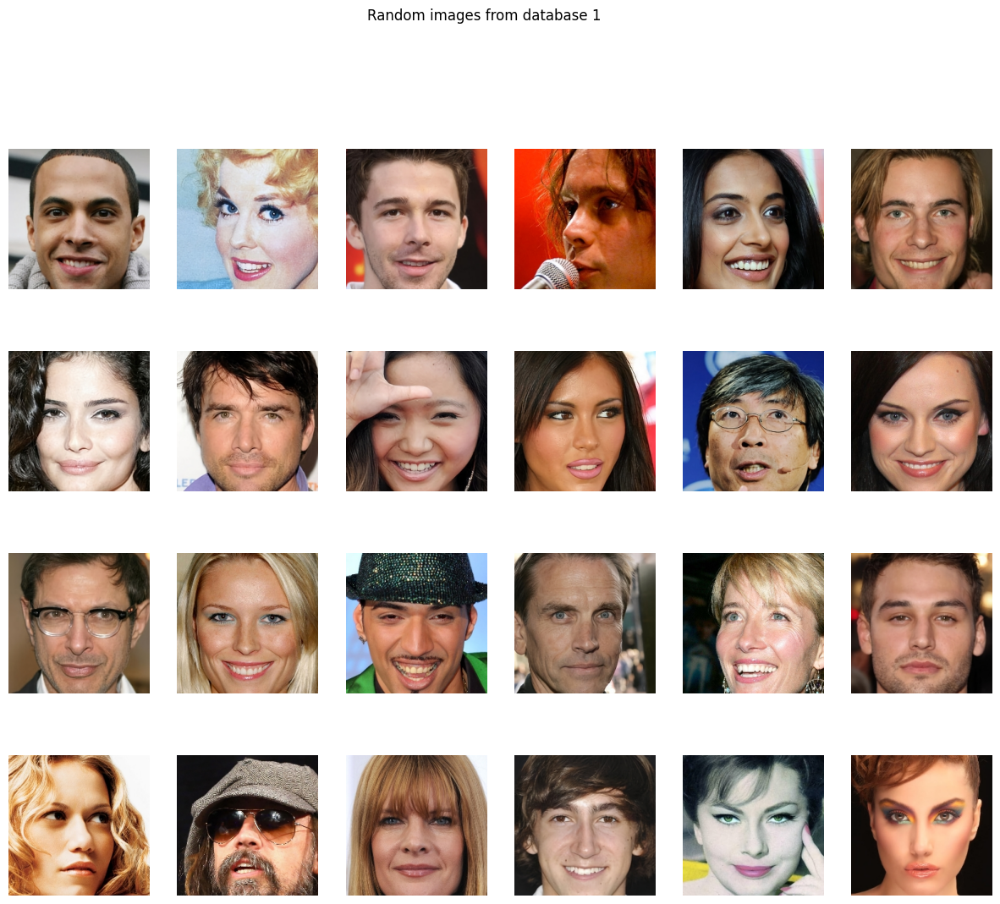

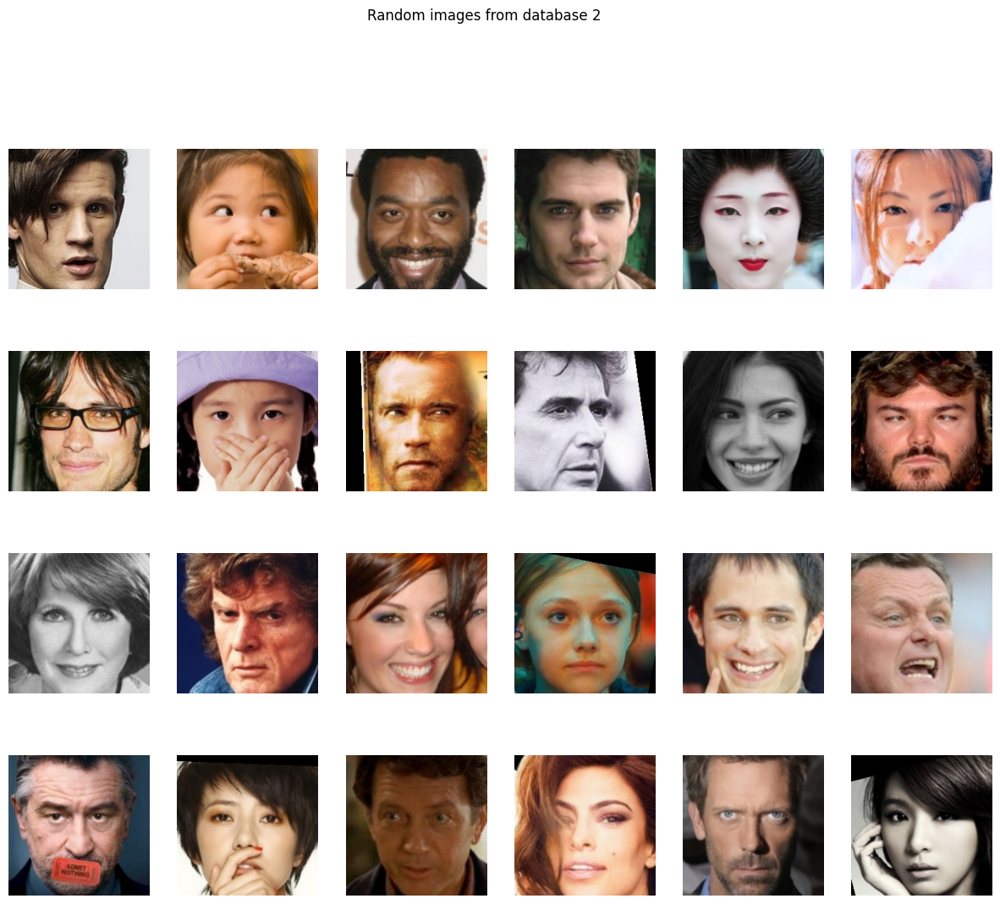

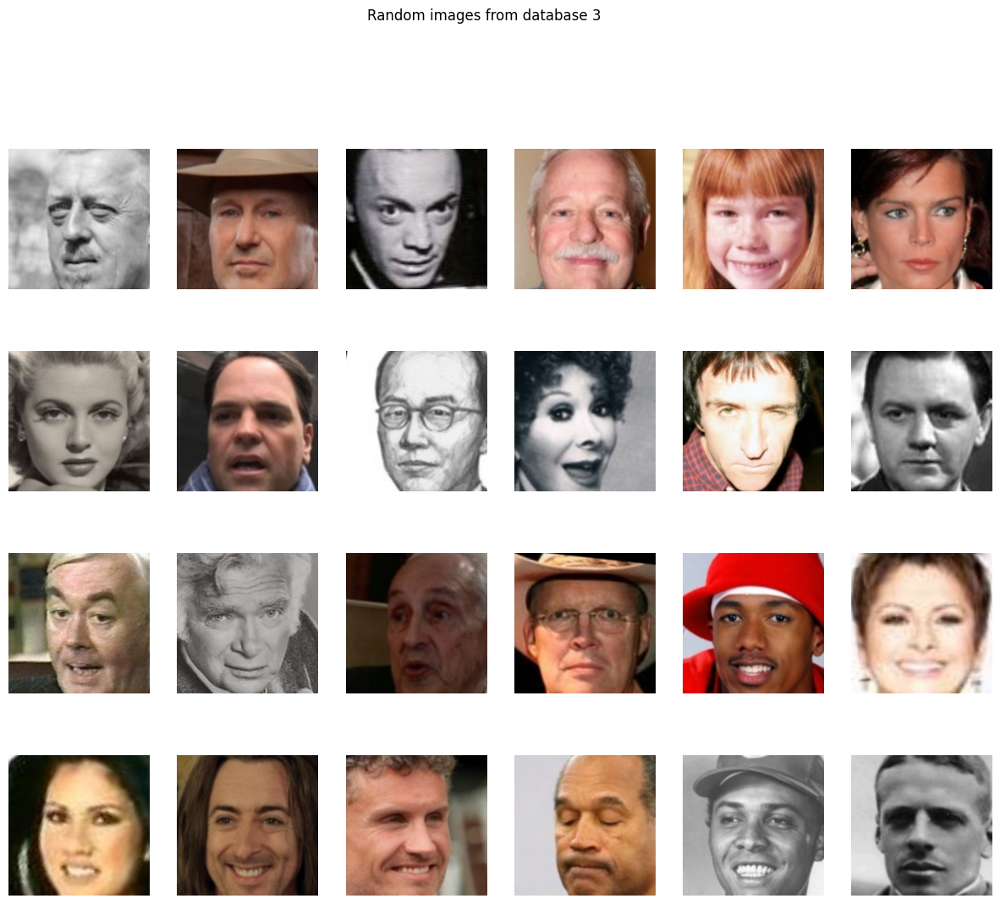

In [ ]:
df_1 = df_train[df_train['filename'].str.contains('database1', na=False)]
df_2 = df_train[df_train['filename'].str.contains('database2', na=False)]
df_3 = df_train[df_train['filename'].str.contains('database3', na=False)]

n_samples = 24
show_images(df_1.sample(n_samples), image_dir, n_images=6 ,title='Random images from database 1')
show_images(df_2.sample(n_samples), image_dir, n_images=6 ,title='Random images from database 2')
show_images(df_3.sample(n_samples), image_dir, n_images=6 ,title='Random images from database 3')

In [ ]:




bw_img = Image.open("Data/crops_100K/database3/database3/m.01b_6y/40-FaceId-0_align.jpg")
print('black and white image:',np.array(bw_img).shape, is_color(bw_img))

color_img = Image.open("Data/crops_100K/database3/database3/m.01b_6y/33-FaceId-0_align.jpg")
print('color image:',np.array(color_img).shape, is_color(color_img))

# test the function
plt.subplot(1,2,1)
plt.imshow(bw_img)
plt.title('black and white image')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(color_img)
plt.title('color image')
plt.axis('off')
plt.show()

NameError: name 'is_black_and_white' is not defined

In [ ]:
# # Add a column to the dataframe with the information if the image is black and white

# res =[]
# width = []
# height = []
# pixels = []
# channels = []

# for i in range(len(df_train)):
#     if i % 5000 == 0: print(i)

#     # get image information
#     width.append(img.size[0])
#     height.append(img.size[1])
#     pixels.append(img.size[0]*img.size[1])
#     channels.append(len(np.array(img).shape))

#     # check if image is black and white
#     img = Image.open(f"{image_dir}/{df_train.iloc[i]['filename']}")
#     res.append( is_black_and_white(img) )

# for i in range(len(df_train)):
#     if i % 5000 == 0: print(i)
#     img = Image.open(f"{image_dir}/{df_train.iloc[i]['filename']}")
#     res.append( is_black_and_white(img) )

# df_train['black_and_white'] = res
# df_train['image_width'] = width
# df_train['image_height'] = height
# df_train['pixels'] = pixels
# df_train['channels'] = channels

In [ ]:
# Explore other features
# ---------------------- 
# skin color
# age
# glasses
# hair color
# hair length
# facial hair
# head pose
# hat

# SAVE DATAFRAME

In [ ]:
import pickle

In [ ]:
with open('df_train.pkl', 'wb') as f:
    pickle.dump(df_train, f)

In [ ]:
# open the file for reading
with open('df_train.pkl', 'rb') as f:
    df_train = pickle.load(f)